<a href="https://colab.research.google.com/github/flaviecousin/ProjetCycleA3_Arborescence_St_Quentin/blob/feature%2FAI/Besoin_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#importation de toutes les bibliothèques nécessaires au bon fonctionnement de nos programmes
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import joblib
#longitude,latitude,clc_quartier,clc_secteur,haut_tot,haut_tronc,tronc_diam,fk_arb_etat,fk_stadedev,fk_port,fk_pied,fk_situation,fk_revetement,age_estim,fk_prec_estim,clc_nbr_diag,fk_nomtech,villeca,feuillage,remarquable


In [ ]:
from google.colab import drive #ajustement du chemin d'accès
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
data=pd.read_csv("gdrive/MyDrive/PROJET_IA/Data_Arbre.csv") #lecture de données du csv
print(type(data))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
data.info() # permet de voir si des valeurs sont nulles et leurs types, on s'attend à ne rien voir d'autre que des variables
data_haut = data['haut_tot']
print(type(data_haut[0]))

X_coord=[]
Y_coord=[]

type(data['longitude'])
#création de coordonnnées tierce pour étudier le nuage de points et faire des tests sur les colorbars()
for i in range(0,len(data['longitude']-1)):
  X_coord.append(data['longitude'][i])
  Y_coord.append(data['latitude'][i])

#plt.scatter(X_coord,Y_coord)
#plt.colorbar()

data['haut_tot']
data['tronc_diam']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7409 entries, 0 to 7408
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   longitude      7409 non-null   float64
 1   latitude       7409 non-null   float64
 2   clc_quartier   7409 non-null   object 
 3   clc_secteur    7409 non-null   object 
 4   haut_tot       7409 non-null   float64
 5   haut_tronc     7409 non-null   float64
 6   tronc_diam     7409 non-null   float64
 7   fk_arb_etat    7409 non-null   object 
 8   fk_stadedev    7409 non-null   object 
 9   fk_port        7409 non-null   object 
 10  fk_pied        7409 non-null   object 
 11  fk_situation   7409 non-null   object 
 12  fk_revetement  7409 non-null   object 
 13  age_estim      7409 non-null   float64
 14  fk_prec_estim  7409 non-null   float64
 15  clc_nbr_diag   7409 non-null   float64
 16  fk_nomtech     7409 non-null   object 
 17  villeca        7409 non-null   object 
 18  feuillag

0        37.0
1       160.0
2       116.0
3       150.0
4       170.0
        ...  
7404     15.0
7405     15.0
7406     15.0
7407     15.0
7408     15.0
Name: tronc_diam, Length: 7409, dtype: float64

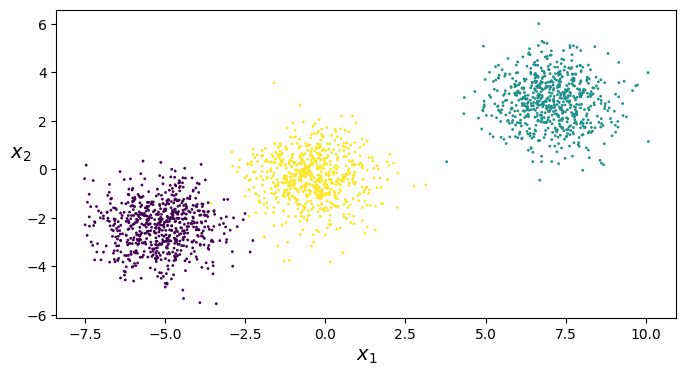

In [ ]:
#récupération de précédent TP et test de clustering
#cette partie n'a pour but que d'expérimenter et ré-apprendre à utiliser les fonctionnalité de base du clustering
from sklearn.datasets import make_blobs
blob_centers = np.array(
  [ [ 0.2, 2.3],
    [-1.5 , 2.3],
    [-2.8, 1.8],
    [-2.8, 2.8],
    [-2.8, 1.3] ])

blob_std = np.array([0.4, 0.3, 0.1, 0.1, 0.1])
# "X" représente les données et "y" représente les indices de clusters réels

X, y = make_blobs(n_samples=2000, n_features=2)

def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=1)
    plt.xlabel("$x_1$", fontsize=14)
    plt.ylabel("$x_2$", fontsize=14, rotation=0)
plt.figure(figsize=(8, 4))
plot_clusters(X,y)
plt.show()


#on s'attendez à ces résultats


[[49.84050020512298, 3.2932636093638927], [49.86140871336124, 3.273379794709001], [49.84451310660708, 3.289067824663547], [49.86177771714989, 3.30238687765097], [49.85844620245707, 3.3040472408930164], [49.86092815875158, 3.3055374576904195], [49.83789717103086, 3.271264477315809], [49.83759002208269, 3.270542022798621], [49.837513824511056, 3.2703639865278205], [49.837363346686566, 3.2699987322142414], [49.83677149088616, 3.2686778980916245], [49.836690672182, 3.2684891765030604], [49.83661587104197, 3.2683265978609035], [49.83485106460306, 3.2644474579549296], [49.83469510633891, 3.264081476895156], [49.834610573696686, 3.2639034150127557], [49.834519396616585, 3.263719806718418], [49.834364800893226, 3.263381048264875], [49.83348707488355, 3.261410269368493], [49.83274760000232, 3.259813743893175], [49.83266687055828, 3.259633876276933], [49.83257455610548, 3.2594435957529773], [49.83250782823191, 3.2593006728613987], [49.83233560309981, 3.2589132043395206], [49.83221066433117, 3.25

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6059033455445145 Silhouette Score
21693.465506851382 Calinski Harabasz Score
0.520988931098512 Davie Bouldin Score


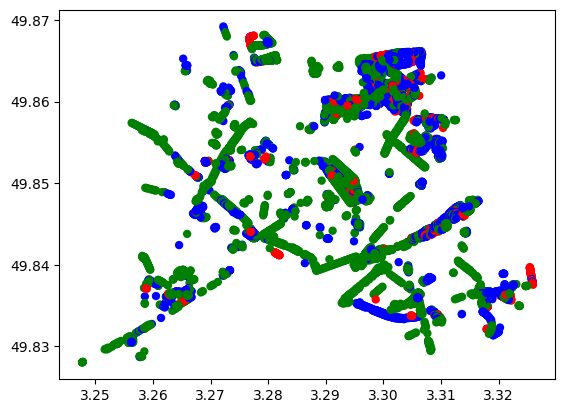

In [ ]:
#cette partie concerne donc le besoin du client 1
from sklearn.datasets import make_blobs
from sklearn.metrics import normalized_mutual_info_score
from collections import Counter
from sklearn.metrics import (silhouette_score,calinski_harabasz_score,davies_bouldin_score)
import pickle

#mettre le jeu de données des tailles dans une variable utilisable
X_taille = np.array(data_haut)
X_tronc = np.array(data['tronc_diam'])
X2_coord = []
#doit faire des coordonnées
for i in range(0,len(X_coord)):
    X2_coord.append([Y_coord[i],X_coord[i]])
print(X2_coord)
#création des clusters
k_means = KMeans(n_clusters=3)
k_means2 = KMeans(n_clusters=2)

#réarrangement des variables de coordonnées pour leur utilisation future
X_taille=X_taille.reshape(-1,1)
X_tronc=X_tronc.reshape(-1,1)

#finition des clusters et prédiction
k_means.fit_predict(X_taille,X_tronc)

k_means2.fit_predict(X_taille,X_tronc)


joblib.dump(k_means, 'gdrive/MyDrive/PROJET_IA/Besoin client 1/k_means.pkl')

joblib.dump(k_means, 'gdrive/MyDrive/PROJET_IA/Besoin client 1/k_means2.pkl')






#nuage de point
couleurs=np.array(["red","green","blue"])
plt.scatter(X_coord,Y_coord,c=couleurs[k_means.labels_],s=25)
#ici, le k_means est utilisable et X_taille et fait

#calcul des scores avec différentes méthode de scoring
dictionnaire_score = {"Silhouette Score" : silhouette_score,"Calinski Harabasz Score":calinski_harabasz_score,"Davie Bouldin Score":davies_bouldin_score}
for i, j in dictionnaire_score.items():
  score = j(X_taille, k_means.labels_)
  print(score, f'{i}')


#0.6059033455445145   Silhouette
#21693.465506851382   Calinski
#0.520988931098512    Davie
#on a des résultats on ne peut plus satisfaisant et un nuage de points en fonction des clusters et des positions

In [ ]:
import folium
import plotly.express as px
import branca.colormap as cmp
#affichage de la carte, avec les coordonnées et clusters
centre= [49.84887, 3.29]
carte=folium.Map(location = centre, zoom_start = 13)
#folium.PolyLine(X2_coord, color="red", weight=2.5, opacity=2).add_to(carte)
#carte2 = px.scatter_mapbox(X2_coord,zoom=13,color=couleurs,title="Taille d'arbres de ST-Quentin")
#carte2.show()

#pour les couleurs : k_means.labels_
clusters_couleur = ["red","green","blue"]

barre = cmp.StepColormap(
 clusters_couleur,
 vmin=0, vmax=2,
 caption='Arbres moyens___________________ Arbres petits___________________ Abres grands'
)
#import du nuage de point
for i in range(0,len(X2_coord)):
  folium.Circle(
     location=X2_coord[i],
     radius=25,
     color=clusters_couleur[k_means.labels_[i]],
     fill=True,
     fill_opacity=8,
     opacity=12,
    ).add_to(carte)
#import de la barre
barre.add_to(carte)
carte


In [ ]:
carte.save("carte.html")

chemin = "gdrive/MyDrive/PROJET_IA/Besoin client 1/carte.html"

# Enregistrer le chemin avec pickle
with open("carte_1.pkl", "wb") as f:
    pickle.dump(chemin, f)

print("on a la carte1")

on a la carte1


In [ ]:
#affichage de la carte, avec les coordonnées et clusters
centre= [49.84887, 3.29]
carte2=folium.Map(location = centre, zoom_start = 13)
#folium.PolyLine(X2_coord, color="red", weight=2.5, opacity=2).add_to(carte)
#carte2 = px.scatter_mapbox(X2_coord,zoom=13,color=couleurs,title="Taille d'arbres de ST-Quentin")
#carte2.show()

#pour les couleurs : k_means.labels_
clusters_couleur = ["red","blue"]

barre = cmp.StepColormap(
 clusters_couleur,
 vmin=0, vmax=2,
 caption='Arbres petits___________________ Abres grands'
)
#import du nuage de point
for i in range(0,len(X2_coord)):
  folium.Circle(
     location=X2_coord[i],
     radius=25,
     color=clusters_couleur[k_means2.labels_[i]],
     fill=True,
     fill_opacity=8,
     opacity=12,
    ).add_to(carte2)
#import de la barre
barre.add_to(carte2)
carte2



In [ ]:
carte2.save("carte2.html")

chemin2 = "gdrive/MyDrive/PROJET_IA/Besoin client 1/carte2.html"

# Enregistrer le chemin avec pickle
with open("carte_2.pkl", "wb") as f:
    pickle.dump(chemin2, f)
print("on a la carte2")

on a la carte2


In [ ]:
#script client 1

#prendre le max et min de chaque cluster, puis vérifier où est l'arbre

#faire attention : numéro des clusters : grand = 2 ; moyen = 0; petit = 1


def script_client_1(arbres,k_means):
  cluster_arbre=""
  grand=[]
  moyen=[]
  petit=[]
  for i in range(len(k_means.labels_)):
      if(k_means.labels_[i]==2):
        grand.append(data_haut[i])
      elif(k_means.labels_[i]==1):
        petit.append(data_haut[i])
      else:
        moyen.append(data_haut[i])

  max_g,min_g=max(grand),min(grand)
  max_m,min_m=max(moyen),min(moyen)
  max_p,min_p=max(petit),min(petit)

  hauteur = arbres["haut_tot"]
  if(hauteur<=max_p):
    cluster_arbre = "petit (cluster 1)"
  elif(hauteur<=max_m and hauteur>=max_p):
    cluster_arbre = "moyen (cluster 0)"
  else:
    cluster_arbre = "grand (cluster 2)"
  return ("l'arbre fait parti du cluster:",cluster_arbre)

arbre_test = {"longitude":3.293263609,"latitude":49.84050021,"clc_quartier":"Quartier du Centre-Ville","clc_secteur":"Quai Gayant","haut_tot":65,"haut_tronc":28,"tronc_diam":37,"fk_arb_etat":"EN PLACE","fk_stadedev":"Jeune","fk_port":"semi libre","fk_pied":"gazon","fk_situation":"Alignement","fk_revetement":"Non","age_estim":15,"fk_prec_estim":5,"clc_nbr_diag":0,"fk_nomtech":"QUERUB","villeca":"VILLE","feuillage":"Feuillu","remarquable":"Non"}

script_client_1(arbre_test,k_means)

("l'arbre fait parti du cluster:", 'grand (cluster 2)')

In [ ]:
#CETTE CELLULE NE PEUT S'EXECUTER  QUE SI LES INFORMATIONS DANS sys.argv SONT REMPLIES, elle agit comme un terminal.

import argparse
import random
import sys



#construction d'un fichier pickel qui servira d'enregistrement de modèle

def checkArguments():
    """Check program arguments and return program parameters."""
    parser = argparse.ArgumentParser()
    parser.add_argument('-lat', '--latitude', type=float, required=False,
                        help='latitude')
    parser.add_argument('-lon', '--longitude', type=float, required=False,
                        help='longitude')
    parser.add_argument('-h_tot', '--haut_tot', type=float, required=True,
                        help='longitude')
    parser.add_argument('-tr_diam', '--tronc_diam', type=float, required=True,
                        help='longitude')
    return parser.parse_args()



#ici, remplissez avec vos valeurs la liste sys.argv pour voir la magie s'opérer:
sys.argv = ['projet_IA.py', '-h_tot', '1', '-tr_diam', '1']


# Main program
args = checkArguments()

arbre_test = {"longitude":3.293263609,"latitude":49.84050021,"clc_quartier":"Quartier du Centre-Ville","clc_secteur":"Quai Gayant","haut_tot":args.haut_tot,"haut_tronc":28,"tronc_diam":args.tronc_diam,"fk_arb_etat":"EN PLACE","fk_stadedev":"Jeune","fk_port":"semi libre","fk_pied":"gazon","fk_situation":"Alignement","fk_revetement":"Non","age_estim":15,"fk_prec_estim":5,"clc_nbr_diag":0,"fk_nomtech":"QUERUB","villeca":"VILLE","feuillage":"Feuillu","remarquable":"Non"}

print(script_client_1(arbre_test,k_means))




("l'arbre fait parti du cluster:", 'petit (cluster 1)')
